In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import jax
import jax.numpy as jnp
import numpy as np
import diffrax
import matplotlib.pyplot as plt

from soromox.systems.tendon_actuated_pcs import TendonActuatedPCS

from controllers.MPPI import ModelPredictivePathIntegralControl

In [7]:
num_segments = 2  # number of segments in the robot
params = {
    "p0": jnp.array([jnp.pi / 2, jnp.pi / 2, 0.0, 0.0, 0.0, 0.0]),  # Initial position and orientation
    "L": 1e-1 * jnp.ones((num_segments,)),  # default: 1e-1
    "r": 2e-2 * jnp.ones((num_segments,)),  # default: 2e-2
    "rho": 1070 * jnp.ones((num_segments,)),  # Volumetric density of Dragon Skin 20 [kg/m^3]
    "g": jnp.array([0.0, 0.0, 9.81]),  # Gravity vector [m/s^2]
    "E": 2e3 * jnp.ones((num_segments,)),  # Elastic modulus [Pa]
    "G": 1e3 * jnp.ones((num_segments,)),  # Shear modulus [Pa]
}
params["D"] = 1e-3 * jnp.diag((jnp.repeat(jnp.array([[1e0, 1e0, 1e0, 1e3, 1e3, 1e3]]), num_segments, axis=0) * params["L"][:, None]).flatten())
active_tendon_routing_params = {
    "ry": 2e-2 * jnp.array([1.0, -1.0]),  # y-coordinate of the pulling point of the tendons [m]
    "rz": 2e-2 * jnp.array([0.0, 0.0]),  # z-coordinate of the pulling point of the tendons [m]
    "my": jnp.array([0.0, 0.0]),  # slope coefficient in the x-y plane of the tendons [-]
    "mz": jnp.array([0.0, 0.0]),  # slope coefficient in the x-z plane of the tendons [-]
    "idx_seg_att": jnp.array([1, 0]),  # length of the tendons = x-coordinate of the attachment points [m]
}
passive_tendon_routing_params = {
    "ry": 2e-2 * jnp.array([0.0]),  # y-coordinate of the pulling point of the tendons [m]
    "rz": 2e-2 * jnp.array([1.0]),  # z-coordinate of the pulling point of the tendons [m]
    "my": jnp.array([0.0]),  # slope coefficient in the x-y plane of the tendons [-]
    "mz": jnp.array([0.0]),  # slope coefficient in the x-z plane of the tendons [-]
    "idx_seg_att": jnp.array([1]),  # length of the tendons = x-coordinate of the attachment points [m]
}
passive_tendon_params = {
    "k_pt": jnp.array([0.6]),
    "d_pt": jnp.array([0.1]),
    "l_pt0": jnp.array([-0.3]),
}

# ======================================================
# Robot initialization
# ======================================================
robot = TendonActuatedPCS(
    num_segments=num_segments,
    params=params,
    active_tendon_routing_params=active_tendon_routing_params,
    passive_tendon_routing_params=passive_tendon_routing_params,
    passive_tendon_params=passive_tendon_params
)


nx = 2 * 6 * num_segments
nu = 2

dynamics_model = lambda t, x, u: robot.simplified_forward_dynamics(t, x, (u,))

In [14]:
N = 30
dt = 0.01
Q = jnp.diag(jnp.array([100.0]*int(nx/2) + [1.0]*int(nx/2)))
R = jnp.diag(jnp.array([0.01]*nu))

# chi_eq = jnp.array([[-jnp.pi/2, 0.0, -robot.L.sum()]])
q_eq = jnp.zeros(nx//2)
qd_eq = jnp.zeros_like(q_eq)
x_eq = jnp.concatenate([q_eq, qd_eq])
u_eq = jnp.zeros(nu)

q0 = jnp.repeat(jnp.array([0.0, 0.0, 5.0 * jnp.pi, 0.1, 0.2, 0.0])[None, :], num_segments,axis=0).flatten() * 0
qd0 = jnp.zeros_like(q0)
x0 = jnp.concatenate([q0, qd0])

controller = ModelPredictivePathIntegralControl(dynamics_model, N, dt, nu, Q, R, x_eq, u_max=2.0, sigma=0.1, correlation=0.9)

In [15]:
controller.auto_choose_temperature(x_eq)

8126.9291450558485 0.012304770746135599


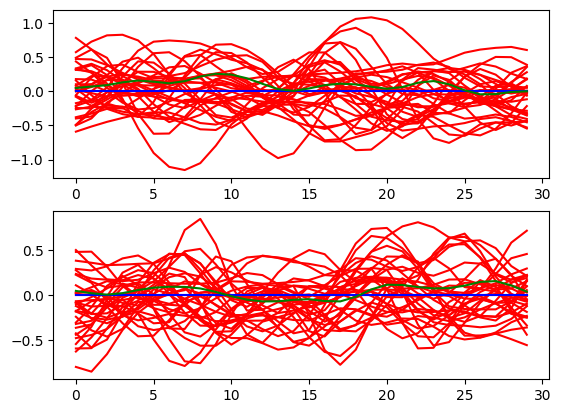

[-1.27404001e-207  1.02677495e-209]


In [16]:
u_sample = controller.sample_u(controller.mu, controller.Sigma)
J_sample = controller.batch_compute_trajectory_cost(u_sample, x0)
m, S, w = controller.update_distribution(u_sample, J_sample, update_variance=True)

fig, ax = plt.subplots(2, 1)
ax[0].plot(u_sample[:, 0, :].T, c='r')
ax[0].plot(controller.control_input[0, :], c='b')
ax[0].plot(m[0, :], c='g')
ax[1].plot(u_sample[:, 1, :].T, c='r')
ax[1].plot(controller.control_input[1, :], c='b')
ax[1].plot(m[1, :], c='g')
plt.show()

controller.mu = m
# controller.Sigma = S
print(jnp.linalg.det(S))

In [17]:
# ---------------------------------------------------------
# 4. SIMULATION USING JAX REAL DYNAMICS
# ---------------------------------------------------------
@jax.jit
def simulate_step(t, x, u):
    sol = diffrax.diffeqsolve(terms=diffrax.ODETerm(robot.forward_dynamics), solver=diffrax.Tsit5(), t0=t, t1=t+dt, dt0=1e-4, y0=x, args=(u,), saveat=diffrax.SaveAt(ts=[t+dt]))
    return sol.ys

T_sim = 0.1
steps = int(T_sim / dt)

t = 0.0
x = x0

controller.solve(x, num_iter=10)

trajectory_x = [x]
trajectory_u = []
trajectory_cost = x.T @ controller.Q @ x
s_batch = jnp.linspace(0.0, robot.L.sum(), 100)
trajectory_pos = [robot.forward_kinematics_batched(jnp.split(x, 2)[0], s_batch)]

for step in range(steps):
    compute_times = controller.solve(x)
    print(controller.compute_trajectory_cost(controller.control_input, x).squeeze(), compute_times)
    u = controller.get_control_input_and_step()
    x = np.asarray(simulate_step(t, x, u)).squeeze()
    t += dt
    trajectory_x.append(x)
    trajectory_u.append(u)
    trajectory_cost += x.T @ controller.Q @ x + u.T @ controller.R @ u
    trajectory_pos.append(robot.forward_kinematics_batched(jnp.split(x, 2)[0], s_batch))

trajectory_x = np.array(trajectory_x).reshape(steps+1, nx, 1)
trajectory_u = np.array(trajectory_u).reshape(steps, nu, 1)
trajectory_pos = np.array(trajectory_pos)
trajectory_t = np.arange(trajectory_x.shape[0]) * dt

print("Finished closed loop simulation.")
print("Trajectory Cost: ", trajectory_cost * dt)

3578.889656174975 {'sampling': 0.0010988890007865848, 'trajectory cost': 13.411156177999146, 'update': 0.003177524000420817}
3851.478567797581 {'sampling': 0.001191102001030231, 'trajectory cost': 14.667553003999274, 'update': 0.007809097000063048}
4117.127588920893 {'sampling': 0.0014646620002167765, 'trajectory cost': 13.85734221599887, 'update': 0.009395647000928875}
4394.261620701358 {'sampling': 0.0013101990007271525, 'trajectory cost': 13.73628783499953, 'update': 0.0056774980002956}
4670.87077618786 {'sampling': 0.0012596470005519222, 'trajectory cost': 13.269810505998976, 'update': 0.007826868999472936}
4962.315283444826 {'sampling': 0.0012719469996227417, 'trajectory cost': 14.322527655998783, 'update': 0.003192263000528328}
5262.790498699107 {'sampling': 0.0007082540014380356, 'trajectory cost': 12.804494305000844, 'update': 0.0031385549991682637}
5569.736845573815 {'sampling': 0.0010696350000216626, 'trajectory cost': 13.889349044999108, 'update': 0.005039883999415906}
5887.

In [12]:
print(trajectory_pos.shape)

(11, 100, 4, 4)


In [ ]:
# trajectory_x = np.array(trajectory_x[:-1]).reshape(-1, nx, 1)
# trajectory_u = np.array(trajectory_u[:-1]).reshape(-1, nu, 1)
# trajectory_pos = np.array(trajectory_pos[:-1])
# trajectory_t = np.arange(trajectory_x.shape[0]) * dt

In [18]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

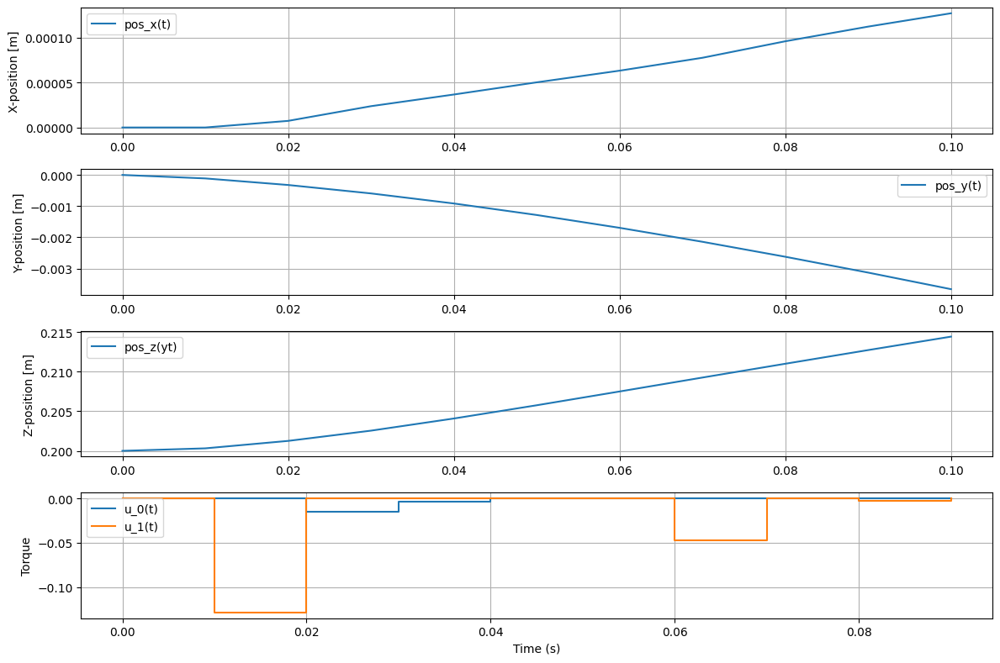

In [19]:
plt.figure(figsize=(12,8))

# -----------------------------
# Plot X position
# -----------------------------
plt.subplot(4,1,1)
plt.plot(trajectory_t, trajectory_pos[:, -1, 0, -1], label="pos_x(t)")
# plt.axhline(chi_eq[-1, 0], color="k", linestyle="--", label="theta_ref")
plt.ylabel("X-position [m]")
plt.legend()
plt.grid(True)

# -----------------------------
# Plot Y position
# -----------------------------
plt.subplot(4,1,2)
plt.plot(trajectory_t, trajectory_pos[:, -1, 1, -1], label="pos_y(t)")
# plt.axhline(chi_eq[-1, 1], color="k", linestyle="--", label="pos_x_ref")
plt.ylabel("Y-position [m]")
plt.legend()
plt.grid(True)

# -----------------------------
# Plot Z position
# -----------------------------
plt.subplot(4,1,3)
plt.plot(trajectory_t, trajectory_pos[:, -1, 2, -1], label="pos_z(yt)")
# plt.axhline(chi_eq[-1, 2], color="k", linestyle="--", label="pos_y_ref")
plt.ylabel("Z-position [m]")
plt.legend()
plt.grid(True)

# -----------------------------
# Plot Control Input
# -----------------------------
plt.subplot(4,1,4)
for i in range(trajectory_u.shape[1]):
    plt.step(trajectory_t[:-1], trajectory_u[:, i].squeeze(), where="post", label=f"u_{i}(t)")
plt.ylabel("Torque")
plt.xlabel("Time (s)")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
n_t, n_s, _ = trajectory_pos.shape

# --- 2. Setup Plot and Update Function ---

# Determine the overall bounds for the combined data
data_min = np.min(trajectory_pos[:, :, 1:])
data_max = np.max(trajectory_pos[:, :, 1:])
buffer = (data_max - data_min) * 0.1

# Initialize plot
fig, ax = plt.subplots(figsize=(7, 7))
ax.set_title(f'Comparison of {n_s} Points from Two Batches', fontsize=14)
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.set_aspect('equal', adjustable='box')
ax.grid(True, linestyle='--')
ax.set_xlim(data_min - buffer, data_max + buffer)
ax.set_ylim(data_min - buffer, data_max + buffer)
ax.yaxis.set_inverted(True)

# Initial scatter plots
target_plot = ax.scatter(chi_eq[-1, 1], chi_eq[-1, 2], s=200, c='r', marker='o')
traj_plot = ax.scatter(trajectory_pos[0, :, 1], trajectory_pos[0, :, 2], s=100, c='b', marker='o')

# Legend and Time Step Annotation
time_template = 'Time Step = %d / %d'
time_text = ax.text(0.05, 0.95, '', transform=ax.transAxes, backgroundcolor='w')

def update(frame):
    """Updates the position of both scatter plots for the given frame (time step)"""
    # Update Batch 1 (Blue)
    X1, Y1 = trajectory_pos[frame, :, 1], trajectory_pos[frame, :, 2]
    traj_plot.set_offsets(list(zip(X1, Y1)))
    
    # Update time text
    time_text.set_text(time_template % (frame + 1, n_t))
    
    # Return both scatter objects and the text object
    return traj_plot, time_text

# --- 3. Create Animation and Display in Notebook ---

ani = FuncAnimation(fig, update, frames=n_t, blit=True, interval=50)

# Close the figure
plt.close(fig)

# Convert the animation to an HTML string and display it
HTML(ani.to_jshtml())

(33, 2, 30) (2, 30)


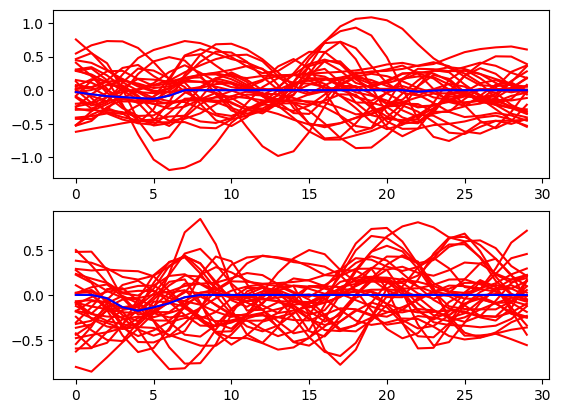

[ 891.01832662 8184.70045297 3257.633019   2194.62538223 1043.76446653
 4117.39175802 1048.76285321 1129.13148494 4090.83000597 1273.19175974
 1890.4112965  1479.26033747 2821.59295973 1029.33013838 1413.70344218
 3624.62149179 2367.85066452 6484.5655426  8238.37246267 2994.66583477
 2390.63582292  959.81221554 1861.55715094 5768.93940059 1979.53736578
 1892.30326339  799.00391474 2296.40633478 4400.79035191 1000.7256439
 1157.61038767 3080.40061061 1500.82776716]


In [ ]:
u_sample = controller.sample_u(controller.mu, controller.Sigma, add_zero_sample=True)
u_apply = controller.control_input
print(u_sample.shape, u_apply.shape)

fig, ax = plt.subplots(2, 1)
ax[0].plot(u_sample[:, 0, :].T, c='r')
ax[0].plot(u_apply[0, :], c='b')
ax[1].plot(u_sample[:, 1, :].T, c='r')
ax[1].plot(u_apply[1, :], c='b')
plt.show()

print(controller.batch_compute_trajectory_cost(u_sample, x).squeeze())